In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import mean_absolute_error, mean_squared_error, classification_report
from sklearn.preprocessing import OneHotEncoder

In [2]:
# Load the Data
data = pd.read_csv("/content/natural_disasters_2024.csv")

In [3]:
# Preprocess Date column
data['Date'] = pd.to_datetime(data['Date'])
data['Month'] = data['Date'].dt.month
data['Day'] = data['Date'].dt.day
data['Hour'] = data['Date'].dt.hour

In [4]:
# One-hot encode Disaster_Type
encoder = OneHotEncoder(sparse_output=False) # Changed 'sparse' to 'sparse_output' to match the latest API.
disaster_type_encoded = encoder.fit_transform(data[['Disaster_Type']])
disaster_type_df = pd.DataFrame(disaster_type_encoded, columns=encoder.categories_[0])


In [5]:
# Add encoded columns to the main dataframe
data = pd.concat([data, disaster_type_df], axis=1)

In [6]:
# Handle Missing Values
data = data.dropna()

In [7]:
# Feature Engineering (e.g., Fatalities/Economic Loss ratio)
# Replace infinite values with NaN
data['Economic_Loss_per_Fatality'] = data['Economic_Loss($)'] / data['Fatalities']
data['Economic_Loss_per_Fatality'] = data['Economic_Loss_per_Fatality'].replace([np.inf, -np.inf], np.nan)

In [8]:
# Train a Model
data = data.dropna()
X = data.drop(columns=['Disaster_ID', 'Disaster_Type', 'Location', 'Date', 'Fatalities'])
y = data['Fatalities']

In [9]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [10]:
# Train the model
model = RandomForestRegressor(n_estimators=100)
model.fit(X_train, y_train)

RandomForestRegressor()

In [11]:
# Predict and Evaluate
y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"MAE: {mae}, RMSE: {rmse}")

MAE: 71.54496499999999, RMSE: 190.32306411953857


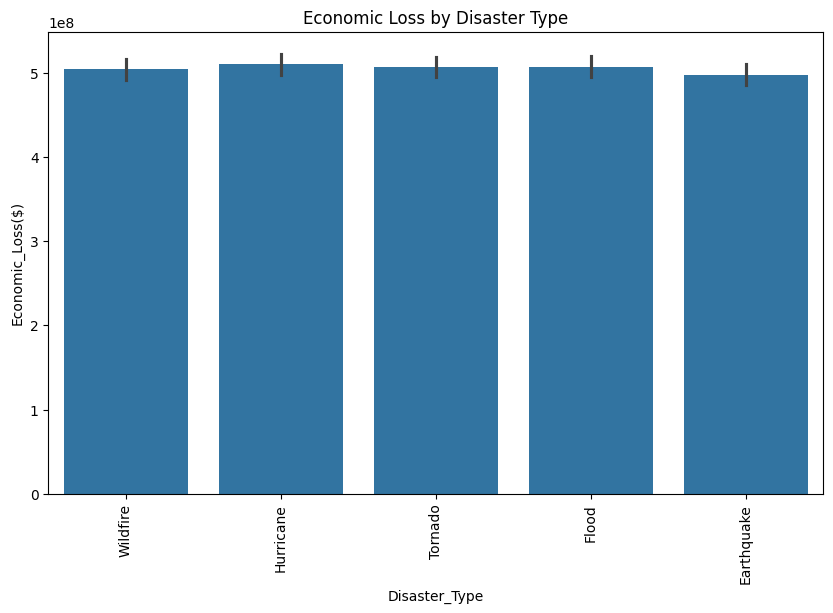

In [12]:

plt.figure(figsize=(10,6))
sns.barplot(x=data['Disaster_Type'], y=data['Economic_Loss($)'])
plt.xticks(rotation=90)
plt.title("Economic Loss by Disaster Type")
plt.show()

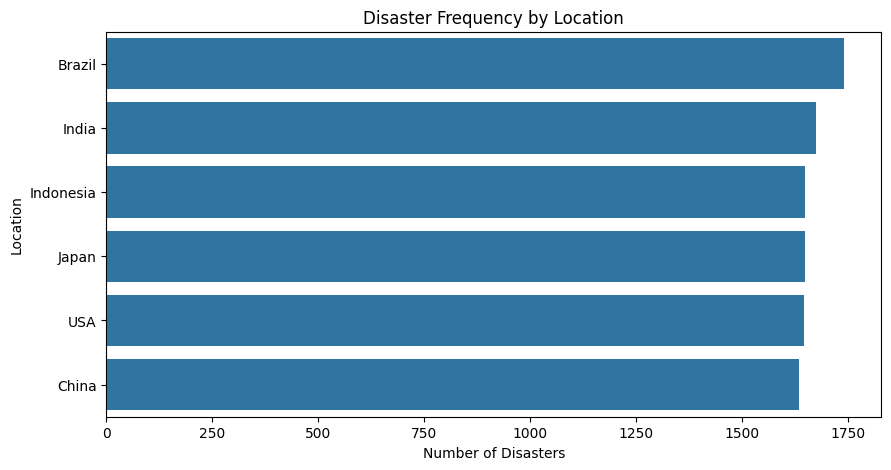

In [13]:
plt.figure(figsize=(10, 5))
sns.countplot(y='Location', data=data, order=data['Location'].value_counts().index)
plt.title("Disaster Frequency by Location")
plt.xlabel("Number of Disasters")
plt.ylabel("Location")
plt.show()


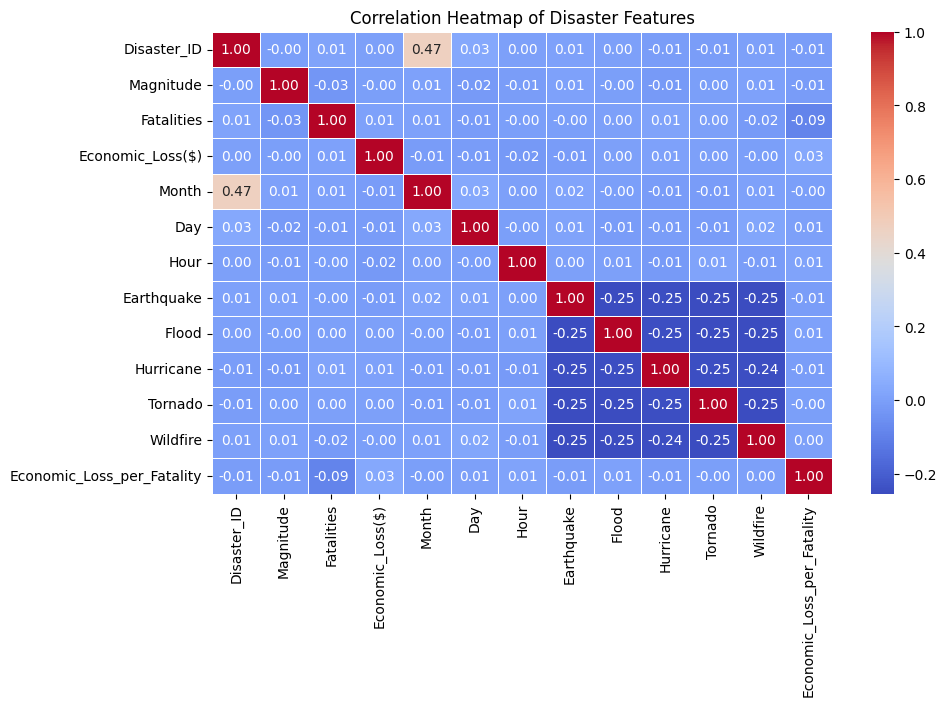

In [14]:

plt.figure(figsize=(10, 6))
# Select only numeric features for correlation
numeric_data = data.select_dtypes(include=np.number)
sns.heatmap(numeric_data.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Disaster Features")
plt.show()


In [24]:
import plotly.express as px

fig = px.scatter(data, x='Magnitude', y='Fatalities', animation_frame='Date', color='Disaster_Type',
                 size='Economic_Loss($)', hover_name='Location', log_x=True, log_y=True,
                 title="Disasters Over Time: Magnitude vs. Fatalities")

fig.update_layout(
    legend=dict(title="Disaster Type", font=dict(size=12), yanchor="top", y=1, xanchor="left", x=1.05),
    margin=dict(l=50, r=200, t=50, b=50)  # Increase right margin for legend
)

fig.show()



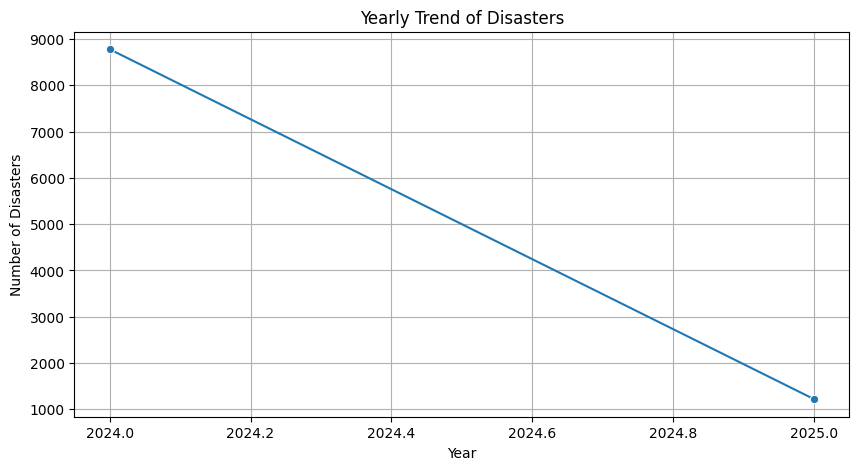

In [16]:
data['Year'] = data['Date'].dt.year
data_grouped = data.groupby('Year').size()

plt.figure(figsize=(10, 5))
sns.lineplot(x=data_grouped.index, y=data_grouped.values, marker='o')
plt.title("Yearly Trend of Disasters")
plt.xlabel("Year")
plt.ylabel("Number of Disasters")
plt.grid(True)
plt.show()


In [17]:
pip install dmba

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 98.0 MB/s eta 0:00:00


In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split


FILE = pd.read_csv("natural_disasters_2024.csv")


A = FILE[['Magnitude', 'Economic_Loss($)', 'Fatalities']]
B = FILE['Disaster_Type']  # target variable

train_A, test_A, train_B, test_B = train_test_split(A, B, test_size=0.2, random_state=42)

train_A = FILE[['Magnitude', 'Economic_Loss($)', 'Fatalities']]
train_B = FILE['Disaster_Type']


In [19]:
# @title Randon forest Classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report


rf_class = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42, class_weight='balanced')

rf_class.fit(train_A, train_B)

pred_rf_class = rf_class.predict(test_A)

print(classification_report(test_B, pred_rf_class))

print(f"Predictions: {pred_rf_class[:10]}")



              precision    recall  f1-score   support

  Earthquake       0.54      0.68      0.60       388
       Flood       0.70      0.59      0.64       403
   Hurricane       0.65      0.62      0.63       399
     Tornado       0.75      0.59      0.66       407
    Wildfire       0.54      0.63      0.58       403

    accuracy                           0.62      2000
   macro avg       0.64      0.62      0.62      2000
weighted avg       0.64      0.62      0.62      2000

Predictions: ['Wildfire' 'Hurricane' 'Flood' 'Flood' 'Earthquake' 'Tornado' 'Hurricane'
 'Earthquake' 'Tornado' 'Earthquake']


In [23]:
# @title XG- Boost Classifier
!pip install xgboost
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb

# Encode target variable (Disaster_Type) into numeric values
label_encoder = LabelEncoder()
B_encoded = label_encoder.fit_transform(B)  # Converts string labels into numeric labels

# Train-test split remains the same
train_A, test_A, train_B, test_B = train_test_split(A, B_encoded, test_size=0.2, random_state=42)

# Train XGBoost model
xgb_classifier = xgb.XGBClassifier(n_estimators=100, max_depth=10, random_state=42) # Now xgb is defined
xgb_classifier.fit(train_A, train_B)

# Predict on test data
pred_xgb = xgb_classifier.predict(test_A)

# Evaluate performance
print(f"XGBoost Accuracy: {xgb_classifier.score(test_A, test_B):.4f}")
print(classification_report(test_B, pred_xgb, target_names=label_encoder.classes_))

XGBoost Accuracy: 0.1980
              precision    recall  f1-score   support

  Earthquake       0.17      0.18      0.17       388
       Flood       0.19      0.19      0.19       403
   Hurricane       0.22      0.21      0.21       399
     Tornado       0.20      0.20      0.20       407
    Wildfire       0.22      0.22      0.22       403

    accuracy                           0.20      2000
   macro avg       0.20      0.20      0.20      2000
weighted avg       0.20      0.20      0.20      2000



In [22]:
# @title Random Forest Regression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
from dmba import regressionSummary


disaster_data = pd.read_csv("natural_disasters_2024.csv")


P = disaster_data[['Magnitude', 'Economic_Loss($)', 'Fatalities']]  # Features
Q = disaster_data['Fatalities']  # Target for regression


train_P, test_P, train_Q, test_Q = train_test_split(P, Q, test_size=0.2, random_state=42)


rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)


rf_regressor.fit(train_P, train_Q)

pred_rf_reg = rf_regressor.predict(test_P)

regressionSummary(test_Q, pred_rf_reg)

mpe = ((test_Q - pred_rf_reg) / test_Q).replace([float('inf'), -float('inf')], 0).mean() * 100


mape = (abs(test_Q - pred_rf_reg) / test_Q).replace([float('inf'), -float('inf')], 0).mean() * 100


print(f"    Mean Percentage Error (MPE): {mpe:.4f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.4f}")


Colab environment detected.

Regression statistics

               Mean Error (ME) : 0.2097
Root Mean Squared Error (RMSE) : 0.9491
     Mean Absolute Error (MAE) : 0.7154
    Mean Percentage Error (MPE): 0.0227
Mean Absolute Percentage Error (MAPE): 0.0592
